# Spatiotemporal Travel Demand Analysis with NYC Taxi Trip Data Using Spatial Statistics - Preprocessing and EDA

## 1. Preprocessing

#### Data Loading and Initial Exploration

In [57]:
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq
import geopandas as gpd
import pydeck as pdk
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import HourLocator, DateFormatter
from shapely.geometry import MultiPolygon, Polygon
import geodatasets
import contextily as cx
from shapely.geometry import box
import numpy as np

In [58]:
table_yellow = pq.read_table('/Users/jiyeonhwang/Downloads/경희대학교 2025-1학기/GIS와공간분석/공분 프로젝트/yellow_tripdata_2025-01.parquet') # Load the dataset stored in Parquet format
df_yellow = table_yellow.to_pandas() # Convert the Parquet table into a pandas DataFrame
df_yellow.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee
0,1,2025-01-01 00:18:38,2025-01-01 00:26:59,1.0,1.60,1.0,N,229,237,1,10.0,3.5,0.5,3.00,0.0,1.0,18.00,2.5,0.0,0.0
1,1,2025-01-01 00:32:40,2025-01-01 00:35:13,1.0,0.50,1.0,N,236,237,1,5.1,3.5,0.5,2.02,0.0,1.0,12.12,2.5,0.0,0.0
2,1,2025-01-01 00:44:04,2025-01-01 00:46:01,1.0,0.60,1.0,N,141,141,1,5.1,3.5,0.5,2.00,0.0,1.0,12.10,2.5,0.0,0.0
3,2,2025-01-01 00:14:27,2025-01-01 00:20:01,3.0,0.52,1.0,N,244,244,2,7.2,1.0,0.5,0.00,0.0,1.0,9.70,0.0,0.0,0.0
4,2,2025-01-01 00:21:34,2025-01-01 00:25:06,3.0,0.66,1.0,N,244,116,2,5.8,1.0,0.5,0.00,0.0,1.0,8.30,0.0,0.0,0.0


In [59]:
df_yellow.info() # Check data types and overall structure of the DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3475226 entries, 0 to 3475225
Data columns (total 20 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               int32         
 1   tpep_pickup_datetime   datetime64[us]
 2   tpep_dropoff_datetime  datetime64[us]
 3   passenger_count        float64       
 4   trip_distance          float64       
 5   RatecodeID             float64       
 6   store_and_fwd_flag     object        
 7   PULocationID           int32         
 8   DOLocationID           int32         
 9   payment_type           int64         
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
 18  Airport_fee           

In [60]:
df_yellow.columns

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag',
       'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra',
       'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'total_amount', 'congestion_surcharge', 'Airport_fee',
       'cbd_congestion_fee'],
      dtype='object')

#### Temporal Filtering: Selecting the Study Period

In [61]:
start_date = pd.Timestamp("2025-01-20 00:00:00") # Start date of the analysis period

end_date = pd.Timestamp("2025-01-26 23:59:59") # End date of the analysis period

df_yellow = df_yellow[(df_yellow['tpep_dropoff_datetime'] >= start_date) & (df_yellow['tpep_pickup_datetime'] <= end_date)] # Filter data to include only records between 2025-01-20 and 2025-01-26
df_yellow.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee
1682770,2,2025-01-19 00:53:27,2025-01-20 00:41:22,1.0,0.88,1.0,N,144,79,1,7.9,1.0,0.5,0.00,0.00,1.0,13.65,2.5,0.0,0.75
1684407,2,2025-01-19 00:25:24,2025-01-20 00:08:06,1.0,3.56,1.0,N,211,40,1,20.5,1.0,0.5,0.00,0.00,1.0,26.25,2.5,0.0,0.75
1684785,2,2025-01-19 01:16:50,2025-01-20 00:39:18,1.0,0.98,1.0,N,79,107,1,6.5,1.0,0.5,1.22,0.00,1.0,13.47,2.5,0.0,0.75
1695455,2,2025-01-19 07:09:06,2025-01-20 00:00:00,2.0,15.96,5.0,N,231,1,1,85.0,0.0,0.0,0.00,14.06,1.0,100.81,0.0,0.0,0.75
1696493,2,2025-01-19 08:36:49,2025-01-20 08:26:35,2.0,3.94,1.0,N,262,186,1,19.8,0.0,0.5,3.68,0.00,1.0,28.23,2.5,0.0,0.75


#### Handling Missing Value

In [62]:
print(df_yellow.isnull().sum()) # Check the number of missing values in each column

VendorID                      0
tpep_pickup_datetime          0
tpep_dropoff_datetime         0
passenger_count          166007
trip_distance                 0
RatecodeID               166007
store_and_fwd_flag       166007
PULocationID                  0
DOLocationID                  0
payment_type                  0
fare_amount                   0
extra                         0
mta_tax                       0
tip_amount                    0
tolls_amount                  0
improvement_surcharge         0
total_amount                  0
congestion_surcharge     166007
Airport_fee              166007
cbd_congestion_fee            0
dtype: int64


In [63]:
df_yellow.dropna(subset=['passenger_count'], inplace=True) # Remove rows where the passenger_count column has missing values
print(df_yellow.isnull().sum()) # Verify that missing values have been removed 

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
RatecodeID               0
store_and_fwd_flag       0
PULocationID             0
DOLocationID             0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
congestion_surcharge     0
Airport_fee              0
cbd_congestion_fee       0
dtype: int64


#### Creating Hourly Time Variables

In [64]:
# Create hourly time bins based on pickup and dropoff timestamps
df_yellow['hour_pickup'] = df_yellow['tpep_pickup_datetime'].dt.floor('H')  # Round down to the nearest hour (pickup)
df_yellow['hour_dropoff'] = df_yellow['tpep_dropoff_datetime'].dt.floor('H')  # Round down to the nearest hour (dropoff)
df_yellow.head()

/var/folders/57/dv1c_0xn3xs1tzzxdvgp0pth0000gn/T/ipykernel_18466/24698044.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_yellow['hour_pickup'] = df_yellow['tpep_pickup_datetime'].dt.floor('H')  # Round down to the nearest hour (pickup)
/var/folders/57/dv1c_0xn3xs1tzzxdvgp0pth0000gn/T/ipykernel_18466/24698044.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_yellow['hour_dropoff'] = df_yellow['tpep_dropoff_datetime'].dt.floor('H')  # Round down to the nearest hour (dropoff)


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee,hour_pickup,hour_dropoff
1682770,2,2025-01-19 00:53:27,2025-01-20 00:41:22,1.0,0.88,1.0,N,144,79,1,...,0.5,0.00,0.00,1.0,13.65,2.5,0.0,0.75,2025-01-19 00:00:00,2025-01-20 00:00:00
1684407,2,2025-01-19 00:25:24,2025-01-20 00:08:06,1.0,3.56,1.0,N,211,40,1,...,0.5,0.00,0.00,1.0,26.25,2.5,0.0,0.75,2025-01-19 00:00:00,2025-01-20 00:00:00
1684785,2,2025-01-19 01:16:50,2025-01-20 00:39:18,1.0,0.98,1.0,N,79,107,1,...,0.5,1.22,0.00,1.0,13.47,2.5,0.0,0.75,2025-01-19 01:00:00,2025-01-20 00:00:00
1695455,2,2025-01-19 07:09:06,2025-01-20 00:00:00,2.0,15.96,5.0,N,231,1,1,...,0.0,0.00,14.06,1.0,100.81,0.0,0.0,0.75,2025-01-19 07:00:00,2025-01-20 00:00:00
1696493,2,2025-01-19 08:36:49,2025-01-20 08:26:35,2.0,3.94,1.0,N,262,186,1,...,0.5,3.68,0.00,1.0,28.23,2.5,0.0,0.75,2025-01-19 08:00:00,2025-01-20 08:00:00


#### Selecting Essential Variables for O/D Analysis

In [65]:
df_yellow = df_yellow.loc[:,['tpep_pickup_datetime', 'tpep_dropoff_datetime', 'passenger_count', 'PULocationID', 'DOLocationID', 'hour_pickup', 'hour_dropoff']] # Select only the columns needed to construct the O/D matrix
df_yellow.head()

,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,PULocationID,DOLocationID,hour_pickup,hour_dropoff
1682770,2025-01-19 00:53:27,2025-01-20 00:41:22,1.0,144,79,2025-01-19 00:00:00,2025-01-20 00:00:00
1684407,2025-01-19 00:25:24,2025-01-20 00:08:06,1.0,211,40,2025-01-19 00:00:00,2025-01-20 00:00:00
1684785,2025-01-19 01:16:50,2025-01-20 00:39:18,1.0,79,107,2025-01-19 01:00:00,2025-01-20 00:00:00
1695455,2025-01-19 07:09:06,2025-01-20 00:00:00,2.0,231,1,2025-01-19 07:00:00,2025-01-20 00:00:00
1696493,2025-01-19 08:36:49,2025-01-20 08:26:35,2.0,262,186,2025-01-19 08:00:00,2025-01-20 08:00:00


### Apply the same preprocessing steps to the Green Taxi and HVFHV (High Volume For-Hire Vehicle) datasets as done for the yellow dataset

In [40]:
table_green = pq.read_table('/Users/jiyeonhwang/Downloads/경희대학교 2025-1학기/GIS와공간분석/공분 프로젝트/green_tripdata_2025-01.parquet')
table_fhvhv = pq.read_table('/Users/jiyeonhwang/Downloads/경희대학교 2025-1학기/GIS와공간분석/공분 프로젝트/fhvhv_tripdata_2025-01.parquet')
df_green = table_green.to_pandas()
df_fhvhv = table_fhvhv.to_pandas()

In [41]:
print(df_green.isnull().sum()) # Check the number of missing values in each column

VendorID                     0
lpep_pickup_datetime         0
lpep_dropoff_datetime        0
store_and_fwd_flag        1836
RatecodeID                1836
PULocationID                 0
DOLocationID                 0
passenger_count           1836
trip_distance                0
fare_amount                  0
extra                        0
mta_tax                      0
tip_amount                   0
tolls_amount                 0
ehail_fee                48326
improvement_surcharge        0
total_amount                 0
payment_type              1836
trip_type                 1843
congestion_surcharge      1836
cbd_congestion_fee        1836
dtype: int64


In [42]:
print(df_fhvhv.isnull().sum()) # Check the number of missing values in each column

hvfhs_license_num             0
dispatching_base_num          0
originating_base_num    5035135
request_datetime              0
on_scene_datetime       5035135
pickup_datetime               0
dropoff_datetime              0
PULocationID                  0
DOLocationID                  0
trip_miles                    0
trip_time                     0
base_passenger_fare           0
tolls                         0
bcf                           0
sales_tax                     0
congestion_surcharge          0
airport_fee                   0
tips                          0
driver_pay                    0
shared_request_flag           0
shared_match_flag             0
access_a_ride_flag            0
wav_request_flag              0
wav_match_flag                0
cbd_congestion_fee            0
dtype: int64


#### Preprocessing Green Taxi and HVFHV Datasets and Concatenating All Preprocessed Datasets

In [ ]:
df_green.dropna(subset=['passenger_count'], inplace=True) # Remove rows where the passenger_count column has missing values

# Select only the columns needed to construct the O/D matrix
df_green = df_green.loc[:,['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'passenger_count', 'PULocationID', 'DOLocationID']]
df_fhvhv = df_fhvhv.loc[:, ['pickup_datetime', 'dropoff_datetime', 'PULocationID', 'DOLocationID']]

# Filter data to include only records between 2025-01-20 and 2025-01-26
df_green = df_green[(df_green['lpep_dropoff_datetime'] >= start_date) & (df_green['lpep_pickup_datetime'] <= end_date)]
df_fhvhv = df_fhvhv[(df_fhvhv['dropoff_datetime'] >= start_date) & (df_fhvhv['pickup_datetime'] <= end_date)] 

# Create hourly time bins based on pickup and dropoff timestamps
df_green['hour_pickup'] = df_green['lpep_pickup_datetime'].dt.floor('H')  
df_green['hour_dropoff'] = df_green['lpep_dropoff_datetime'].dt.floor('H')
df_fhvhv['hour_pickup'] = df_fhvhv['pickup_datetime'].dt.floor('H')  
df_fhvhv['hour_dropoff'] = df_fhvhv['dropoff_datetime'].dt.floor('H')

df_fhvhv['passenger_count'] = 1 # The HVFHV dataset does not include a passenger_count column, so assign a value of 1 per trip record

# Concatenate all preprocessed datasets into a single DataFrame
df_yellow = df_yellow.rename(columns={'tpep_pickup_datetime':'pickup_datetime',
                                    'tpep_dropoff_datetime':'dropoff_datetime'})

df_green = df_green.rename(columns={'lpep_pickup_datetime':'pickup_datetime',
                                    'lpep_dropoff_datetime':'dropoff_datetime'})

df_total = pd.concat([df_yellow, df_green, df_fhvhv])
df_total.head()

## 2. Hourly Trip Volume Visualization

In [ ]:
# Compute hourly trip counts for each taxi type
hourly_yellow = df_yellow['hour_pickup'].value_counts().sort_index()
hourly_green = df_green['hour_pickup'].value_counts().sort_index()
hourly_fhvhv = df_fhvhv['hour_pickup'].value_counts().sort_index()
hourly_total = df_total['hour_pickup'].value_counts().sort_index()

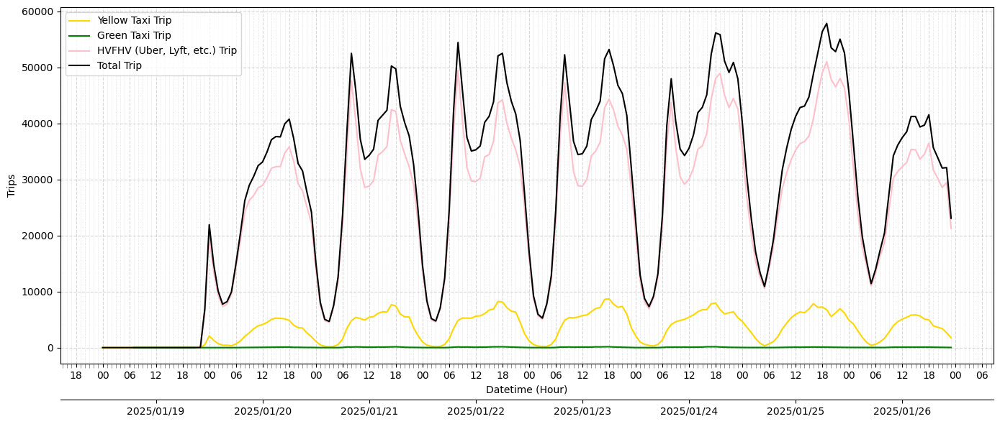

In [ ]:
# Create a time-series plot of hourly trip volumes
fig, ax = plt.subplots(figsize=(14, 6))

ax.plot(hourly_yellow.index, hourly_yellow.values, color='gold', label='Yellow Taxi Trip')
ax.plot(hourly_green.index, hourly_green.values, color='green', label='Green Taxi Trip')
ax.plot(hourly_fhvhv.index, hourly_fhvhv.values, color='pink', label='HVFHV (Uber, Lyft, etc.) Trip')
ax.plot(hourly_total.index, hourly_total.values, color='black', label='Total Trip')

ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))


ax.xaxis.set_minor_locator(mdates.HourLocator(interval=1))
ax.tick_params(axis='x', which='minor', length=4, color='gray')  


ax_secondary = ax.secondary_xaxis('bottom')
ax_secondary.xaxis.set_major_locator(HourLocator(byhour=[12]))
ax_secondary.xaxis.set_major_formatter(mdates.DateFormatter('%Y/%m/%d'))
ax_secondary.spines['bottom'].set_position(('outward', 36))

ax.set_xlabel('Datetime (Hour)')
ax.set_ylabel('Trips')
ax.grid(True, axis='both', linestyle='--', alpha=0.5)
ax.grid(which='minor', axis='x', linestyle=':', linewidth=0.5, color='lightgray')
ax.legend()

plt.tight_layout()
plt.show()


## 3. Constructing the O/D (Origin–Destination) matrix

#### Identifying peak-demand hours from the hourly trip volume plot and build the O/D matrix for those periods


In [66]:
# Weekday (Tuesday) morning peak: 07:00–10:00
df_peak1 = df_total[
    (df_total['hour_pickup'] >= '2025-01-21 07:00:00') &
    (df_total['hour_pickup'] <  '2025-01-21 10:00:00')
]

# Weekday (Tuesday) evening peak: 16:00–19:00
df_peak2 = df_total[
    (df_total['hour_pickup'] >= '2025-01-21 16:00:00') &
    (df_total['hour_pickup'] <  '2025-01-21 19:00:00')
]

# Weekend (Saturday) evening peak: 18:00–20:00
df_peak3 = df_total[
    (df_total['hour_pickup'] >= '2025-01-25 18:00:00') &
    (df_total['hour_pickup'] <  '2025-01-25 20:00:00')
]

# Weekend (Saturday) late-evening peak: 21:00–23:00
df_peak4 = df_total[
    (df_total['hour_pickup'] >= '2025-01-25 21:00:00') &
    (df_total['hour_pickup'] <  '2025-01-25 23:00:00')
]


#### Create O/D matrices for each peak-period dataset

In [ ]:
df_peak_list = [df_peak1, df_peak2, df_peak3, df_peak4]
od_matrix_dic = {}

# Aggregate trip flows by origin and destination for the current peak period
for i, df in enumerate(df_peak_list, start=1):
    od_counts = df.groupby(['PULocationID', 'DOLocationID'])['passenger_count'].sum().reset_index(name="count")
    od_matrix_dic[f'od_matrix_peak{i}'] = od_counts # Store the resulting O/D matrix in a dictionary

In [70]:
od_matrix_dic['od_matrix_peak1'].head()

,PULocationID,DOLocationID,count
0,3,3,55.0
1,3,18,13.0
2,3,20,13.0
3,3,31,1.0
4,3,32,24.0


In [71]:
od_matrix_dic['od_matrix_peak2'].head()

,PULocationID,DOLocationID,count
0,1,1,5.0
1,2,82,1.0
2,3,3,42.0
3,3,7,1.0
4,3,18,5.0


## 4. Aggregating O/D trip counts by origin and destination for each peak period

In [72]:
od_aggregate_peak1 = od_matrix_dic['od_matrix_peak1'].copy()

# 1. Compute total trips by pickup zone
pickup_counts = od_aggregate_peak1.groupby('PULocationID')['count'].sum().reset_index()
pickup_counts.columns = ['zone_id', 'pickup_trip_count']

# 2. Compute total trips by dropoff zone
dropoff_counts = od_aggregate_peak1.groupby('DOLocationID')['count'].sum().reset_index()
dropoff_counts.columns = ['zone_id', 'dropoff_trip_count']

In [73]:
pickup_counts.head()

,zone_id,pickup_trip_count
0,3,423.0
1,4,357.0
2,5,66.0
3,6,89.0
4,7,1246.0


In [74]:
dropoff_counts.head()

,zone_id,dropoff_trip_count
0,1,545.0
1,2,1.0
2,3,336.0
3,4,137.0
4,5,31.0


#### Create aggregated DataFrames for peak periods (peak1–peak4) using a loop

In [75]:
peak = [1, 2, 3, 4]
od_aggregate_dic = {} # Initialize an empty dictionary to store output DataFrames

for i in peak :
    od_aggregate = od_matrix_dic[f'od_matrix_peak{i}'].copy()

    # 1. Compute total trips by pickup zone
    pickup_counts = od_aggregate.groupby('PULocationID')['count'].sum().reset_index()
    pickup_counts.columns = ['zone_id', 'pickup_trip_count']
    od_aggregate_dic[f'pickup_counts_peak{i}'] = pickup_counts

    # 2. Compute total trips by dropoff zone
    dropoff_counts = od_aggregate.groupby('DOLocationID')['count'].sum().reset_index()
    dropoff_counts.columns = ['zone_id', 'dropoff_trip_count']
    od_aggregate_dic[f'dropoff_counts_peak{i}'] = dropoff_counts
    
od_aggregate_dic.keys()

dict_keys(['pickup_counts_peak1', 'dropoff_counts_peak1', 'pickup_counts_peak2', 'dropoff_counts_peak2', 'pickup_counts_peak3', 'dropoff_counts_peak3', 'pickup_counts_peak4', 'dropoff_counts_peak4'])

In [76]:
od_aggregate_dic['pickup_counts_peak1'].head()

,zone_id,pickup_trip_count
0,3,423.0
1,4,357.0
2,5,66.0
3,6,89.0
4,7,1246.0


In [77]:
od_aggregate_dic['pickup_counts_peak2'].head()

,zone_id,pickup_trip_count
0,1,5.0
1,2,1.0
2,3,312.0
3,4,221.0
4,5,31.0


## 5. Preprocessing Taxi Zone Shapefile and Spatial Grid for Analysis

In [78]:
# Load the NYC Taxi Zone shapefile
zonemap_shp = gpd.read_file('/Users/jiyeonhwang/Downloads/경희대학교 2025-1학기/GIS와공간분석/공분 프로젝트/taxi_zones/taxi_zones.shp')
zonemap_shp.head()

# Data Source:
# NYC Taxi Zone Shapefile, NYC Open Data
# https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.77 256767.698, 1026495.593 2..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((935843.31 144283.336, 936046.565 144..."


In [79]:
zonemap_shp.crs # Check the coordinate reference system (CRS)

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [87]:
# Visualize the Taxi Zone shapefile
zonemap_shp.explore()

#### Dissolving all taxi zones into one unified polygon (NYC boundary)

In [88]:
# Create a dummy column to dissolve all taxi zone geometries into a single boundary
zonemap_shp['dummy'] = 1
zonemap_dissolve = zonemap_shp.dissolve(by='dummy')
zonemap_dissolve.head()


,geometry,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough
dummy,,,,,,,
1,"MULTIPOLYGON (((952297.812 138910.318, 952225....",1,0.116357,0.000782,Newark Airport,1,EWR


In [89]:
zonemap_dissolve.explore()

### Generating a 1-mile spatial grid

In [90]:
# Compute the bounding extent of the Taxi Zone layer
minx, miny, maxx, maxy = zonemap_shp.total_bounds

# Define grid cell size (1 mile = 5,280 feet)
grid_size = 5280

# Create a list of 1-mile grid cells covering the entire study area
grid_cells = []
for x0 in np.arange(minx, maxx, grid_size):
    for y0 in np.arange(miny, maxy, grid_size):
        x1 = x0 + grid_size
        y1 = y0 + grid_size
        cell = box(x0, y0, x1, y1)
        grid_cells.append(cell)
        
# Convert grid cells into a GeoDataFrame
grid = gpd.GeoDataFrame(geometry=grid_cells, crs=zonemap_shp.crs)

In [91]:
grid.head()

,geometry
0,"POLYGON ((918455.109 120121.881, 918455.109 12..."
1,"POLYGON ((918455.109 125401.881, 918455.109 13..."
2,"POLYGON ((918455.109 130681.881, 918455.109 13..."
3,"POLYGON ((918455.109 135961.881, 918455.109 14..."
4,"POLYGON ((918455.109 141241.881, 918455.109 14..."


In [92]:
grid.explore()

In [93]:
# Clip the 1-mile grid to the NYC boundary using a spatial intersection
grid_clipped = gpd.overlay(grid, zonemap_dissolve, how="intersection")
grid_clipped.explore()

In [94]:
grid_clipped.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((918455.109 125401.881, 918455.109 12..."
1,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((918455.109 130681.881, 918455.109 12..."
2,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((918455.109 135961.881, 918455.109 13..."
3,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((918455.109 135961.881, 916042.938 13..."
4,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((923735.109 125401.881, 923735.109 12..."


In [95]:
grid_clipped = grid_clipped.iloc[:,[6]] # Keep only the geometry column from the clipped grid
grid_clipped.head()

,geometry
0,"POLYGON ((918455.109 125401.881, 918455.109 12..."
1,"POLYGON ((918455.109 130681.881, 918455.109 12..."
2,"POLYGON ((918455.109 135961.881, 918455.109 13..."
3,"POLYGON ((918455.109 135961.881, 916042.938 13..."
4,"POLYGON ((923735.109 125401.881, 923735.109 12..."


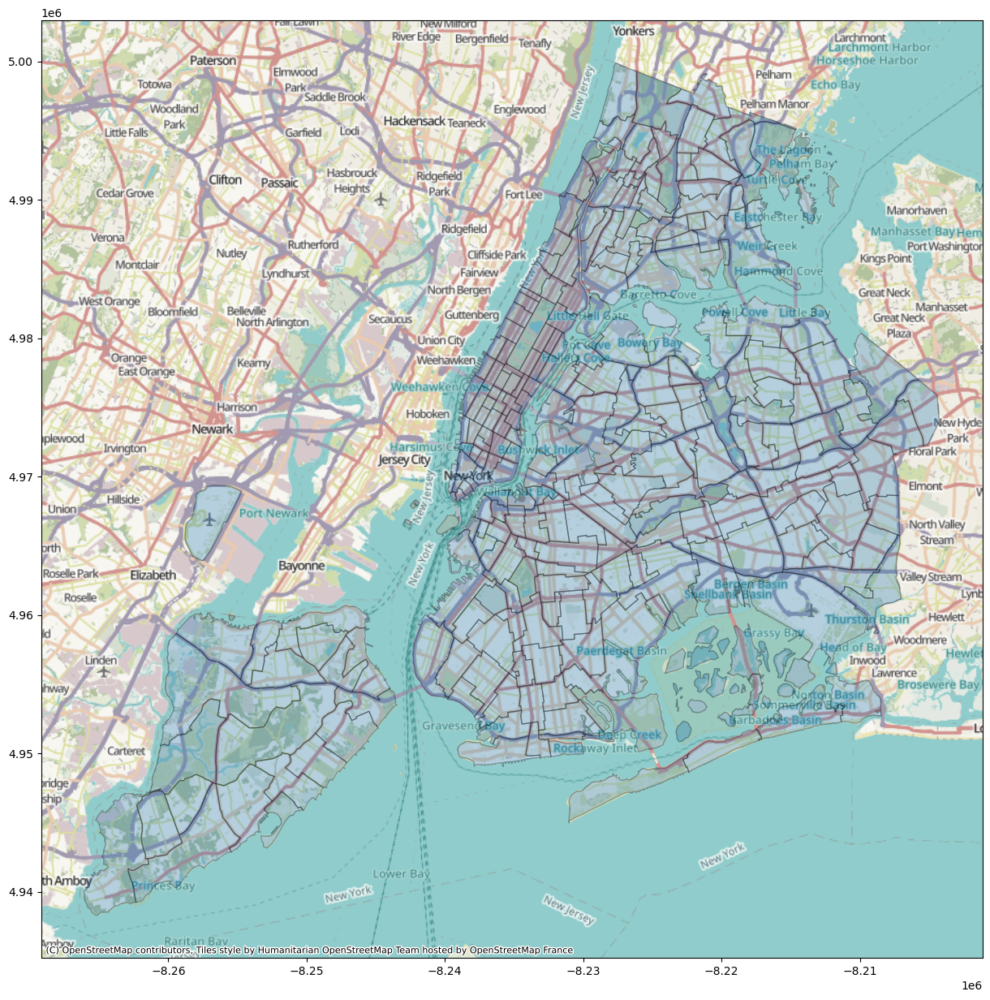

In [96]:
# Perform a CRS transformation to EPSG:3857
zonemap_3857 = zonemap_shp.to_crs(epsg=3857)
ax = zonemap_3857.plot(figsize=(15, 15), alpha=0.3, edgecolor="k")
cx.add_basemap(ax)

## 6. Joining peak-period O/D trip counts to the Taxi Zone polygons

In [97]:
od_aggregate_dic.keys()

dict_keys(['pickup_counts_peak1', 'dropoff_counts_peak1', 'pickup_counts_peak2', 'dropoff_counts_peak2', 'pickup_counts_peak3', 'dropoff_counts_peak3', 'pickup_counts_peak4', 'dropoff_counts_peak4'])

In [98]:
type(zonemap_shp)

geopandas.geodataframe.GeoDataFrame

In [99]:
zonemap_shp.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,dummy
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19...",1
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343...",1
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.77 256767.698, 1026495.593 2...",1
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20...",1
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((935843.31 144283.336, 936046.565 144...",1


In [100]:
# zonemap_shp 복사본 생성 (원본 유지)
zonemap_merged = zonemap_shp.copy()

# Loop through peak periods (peak1–peak4)
for i in range(1, 5):

    # Extract aggregated pickup and dropoff trip counts for the current peak period
    pickup_df = od_aggregate_dic[f'pickup_counts_peak{i}'].copy()
    dropoff_df = od_aggregate_dic[f'dropoff_counts_peak{i}'].copy()
    
    # Rename columns for clarity before merging
    pickup_df = pickup_df.rename(columns={'zone_id': 'OBJECTID', 'pickup_trip_count': f'pickup_counts_peak{i}'})
    dropoff_df = dropoff_df.rename(columns={'zone_id': 'OBJECTID', 'dropoff_trip_count': f'dropoff_counts_peak{i}'})
    
    # Merge trip counts into the Taxi Zone dataset (left join on OBJECTID)
    zonemap_merged = zonemap_merged.merge(pickup_df, on='OBJECTID', how='left')
    zonemap_merged = zonemap_merged.merge(dropoff_df, on='OBJECTID', how='left')

    # Replace missing values with zero and convert to integer type
    zonemap_merged[f'pickup_counts_peak{i}'] = zonemap_merged[f'pickup_counts_peak{i}'].fillna(0).astype(int)
    zonemap_merged[f'dropoff_counts_peak{i}'] = zonemap_merged[f'dropoff_counts_peak{i}'].fillna(0).astype(int)


zonemap_merged.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,dummy,pickup_counts_peak1,dropoff_counts_peak1,pickup_counts_peak2,dropoff_counts_peak2,pickup_counts_peak3,dropoff_counts_peak3,pickup_counts_peak4,dropoff_counts_peak4
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19...",1,0,545,5,474,1,230,0,21
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343...",1,0,1,1,0,0,0,0,0
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.77 256767.698, 1026495.593 2...",1,423,336,312,306,144,152,135,130
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20...",1,357,137,221,378,385,454,513,644
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((935843.31 144283.336, 936046.565 144...",1,66,31,31,42,26,16,16,16


In [101]:
zonemap_merged.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   OBJECTID              263 non-null    int32   
 1   Shape_Leng            263 non-null    float64 
 2   Shape_Area            263 non-null    float64 
 3   zone                  263 non-null    object  
 4   LocationID            263 non-null    int32   
 5   borough               263 non-null    object  
 6   geometry              263 non-null    geometry
 7   dummy                 263 non-null    int64   
 8   pickup_counts_peak1   263 non-null    int64   
 9   dropoff_counts_peak1  263 non-null    int64   
 10  pickup_counts_peak2   263 non-null    int64   
 11  dropoff_counts_peak2  263 non-null    int64   
 12  pickup_counts_peak3   263 non-null    int64   
 13  dropoff_counts_peak3  263 non-null    int64   
 14  pickup_counts_peak4   263 non-null    int64   
 15

In [102]:
zonemap_merged = zonemap_merged.drop('dummy', axis=1) # Remove the unnecessary 'dummy' column

In [103]:
zonemap_merged.crs # Check the coordinate reference system (CRS)

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [104]:
# Reset index after clipping to ensure a clean sequential index
grid_clipped = grid_clipped.reset_index(drop=True) 

# Assign a unique grid ID based on the index
grid_clipped['grid_id'] = grid_clipped.index
grid_clipped.head()

,geometry,grid_id
0,"POLYGON ((918455.109 125401.881, 918455.109 12...",0
1,"POLYGON ((918455.109 130681.881, 918455.109 12...",1
2,"POLYGON ((918455.109 135961.881, 918455.109 13...",2
3,"POLYGON ((918455.109 135961.881, 916042.938 13...",3
4,"POLYGON ((923735.109 125401.881, 923735.109 12...",4


In [105]:
grid_clipped.explode().explore()

In [106]:
grid_clipped.loc[118][0].wkt

/var/folders/57/dv1c_0xn3xs1tzzxdvgp0pth0000gn/T/ipykernel_18466/152755711.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  grid_clipped.loc[118][0].wkt


'MULTIPOLYGON (((987095.109008804 194041.88125434518, 984393.6629126372 194041.88125434518, 984244.8967895657 194110.80438230932, 984395.6719970554 194422.93701170385, 984943.4877929688 194173.7781982422, 984979.9573974758 194172.09063722193, 985037.3295898587 194229.8671874851, 985031.5203857273 194303.3422241211, 985033.0831909329 194343.96740725636, 985014.0100097656 194356.87078860402, 985165.6552124023 194624.86499026418, 985131.215637207 194666.3265991211, 984935.5274047852 194753.04321289062, 984871.0657959282 194800.62219241261, 984859.5543823093 194786.04138182104, 984766.0635986775 194858.68420411646, 985305.7563099563 195535.75502961874, 985598.0048782527 195388.93504804373, 985618.4877812117 195434.91406552494, 985623.6048644185 195446.40042713284, 985512.7738037109 195498.6632080227, 985554.9617920071 195600.22619627416, 985641.3154296726 195537.4385986477, 985691.6829833835 195504.740234375, 985729.7984009087 195555.2568359226, 985675.7962036133 195604.6314086914, 985637.

In [107]:
grid_clipped.explore()

In [108]:
grid_clipped.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [109]:
zonemap_merged.columns

Index(['OBJECTID', 'Shape_Leng', 'Shape_Area', 'zone', 'LocationID', 'borough',
       'geometry', 'pickup_counts_peak1', 'dropoff_counts_peak1',
       'pickup_counts_peak2', 'dropoff_counts_peak2', 'pickup_counts_peak3',
       'dropoff_counts_peak3', 'pickup_counts_peak4', 'dropoff_counts_peak4'],
      dtype='object')

In [110]:
zonemap_merged = zonemap_merged.rename(columns={'pickup_counts_peak1':'pu_1', 'dropoff_counts_peak1':'dof_1',
       'pickup_counts_peak2':'pu_2', 'dropoff_counts_peak2':'dof_2', 'pickup_counts_peak3':'pu_3',
       'dropoff_counts_peak3':'dof_3', 'pickup_counts_peak4':'pu_4', 'dropoff_counts_peak4':'dof_4'})

zonemap_merged.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,pu_1,dof_1,pu_2,dof_2,pu_3,dof_3,pu_4,dof_4
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19...",0,545,5,474,1,230,0,21
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343...",0,1,1,0,0,0,0,0
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.77 256767.698, 1026495.593 2...",423,336,312,306,144,152,135,130
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20...",357,137,221,378,385,454,513,644
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((935843.31 144283.336, 936046.565 144...",66,31,31,42,26,16,16,16


#### Export preprocessed Taxi Zone and 1-mile grid layers

These files are used in R to perform area-weighted areal interpolation reallocating taxi-zone-level trip counts to 1-mile grid cells.

In [111]:
# zonemap_merged.to_file('/Users/jiyeonhwang/Downloads/python/공분 프로젝트/공분플젝 재분석 파일모음/zonemap_with_trips.shp')
# grid_clipped.to_file('/Users/jiyeonhwang/Downloads/python/공분 프로젝트/공분플젝 재분석 파일모음/grid.shp')

## 7. Importing Area Weighted Interpolation results generated in R

In [112]:
areal_interpolate = pd.read_csv('/Users/jiyeonhwang/Downloads/python/공분 프로젝트/areal_interpolate_result.csv')
areal_interpolate.head()

,grid_id,dof_1,dof_2,dof_3,dof_4,dof_5,pu_1,pu_2,pu_3,pu_4,pu_5
0,0,0.0,0.0,0.0,0.158243,0.000000,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0.0,0.0,0.097383,0.000000,0.0,0.0,0.0,0.0,0.0
2,2,0.0,0.0,0.0,0.063690,0.000000,0.0,0.0,0.0,0.0,0.0
3,3,0.0,0.0,0.0,0.055089,0.000000,0.0,0.0,0.0,0.0,0.0
4,4,0.0,0.0,0.0,0.086710,0.028743,0.0,0.0,0.0,0.0,0.0


In [113]:
grid_clipped.head()

,geometry,grid_id
0,"POLYGON ((918455.109 125401.881, 918455.109 12...",0
1,"POLYGON ((918455.109 130681.881, 918455.109 12...",1
2,"POLYGON ((918455.109 135961.881, 918455.109 13...",2
3,"POLYGON ((918455.109 135961.881, 916042.938 13...",3
4,"POLYGON ((923735.109 125401.881, 923735.109 12...",4


In [114]:
# Merge the 1-mile grid with the R-derived area-weighted interpolation results
grid_merge = pd.merge(grid_clipped, areal_interpolate, how='left', on='grid_id')
grid_merge.head()

,geometry,grid_id,dof_1,dof_2,dof_3,dof_4,dof_5,pu_1,pu_2,pu_3,pu_4,pu_5
0,"POLYGON ((918455.109 125401.881, 918455.109 12...",0,0.0,0.0,0.0,0.158243,0.000000,0.0,0.0,0.0,0.0,0.0
1,"POLYGON ((918455.109 130681.881, 918455.109 12...",1,0.0,0.0,0.0,0.097383,0.000000,0.0,0.0,0.0,0.0,0.0
2,"POLYGON ((918455.109 135961.881, 918455.109 13...",2,0.0,0.0,0.0,0.063690,0.000000,0.0,0.0,0.0,0.0,0.0
3,"POLYGON ((918455.109 135961.881, 916042.938 13...",3,0.0,0.0,0.0,0.055089,0.000000,0.0,0.0,0.0,0.0,0.0
4,"POLYGON ((923735.109 125401.881, 923735.109 12...",4,0.0,0.0,0.0,0.086710,0.028743,0.0,0.0,0.0,0.0,0.0


In [115]:
type(grid_merge)

geopandas.geodataframe.GeoDataFrame

In [116]:
# Export the grid with interpolated trip counts to a shapefile
# grid_merge.to_file('/Users/jiyeonhwang/Downloads/python/공분 프로젝트/공분플젝 재분석 파일모음/grid_with_trips.shp')